### Set up

In [1]:
#Import modules

import pandas as pd
pd.options.display.max_columns = 99
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

import dask.dataframe as dd
from dask.diagnostics import ProgressBar

# from numpy import arange, log10

from functions import chunk, agg, finalize
tunique = dd.Aggregation('tunique', chunk, agg,finalize)
first = dd.Aggregation('first', chunk, agg,finalize)

## Sourcing info
### Arrange data

In [2]:
# path = './../../../../../../media/miglesia/Elements/export_france/data/type1/DP1610_MAASTRICHT1_1997_2013/''

### Load data directly

In [3]:
out = pd.read_csv('./../../data/processed/sourcing_strategies_qr.csv')
# out = pd.read_csv('./../data/export_bundles.csv')
out_ri = out.reset_index()
# product_count = out_ri.groupby('ID')[['CN ID 4']].nunique()
sources_count = out_ri.groupby('ID')[['PYOD']].nunique()
multisourcing_firms = sources_count[sources_count['PYOD'] > 1].index
df = out_ri.loc[out_ri.ID.isin(multisourcing_firms)]

In [4]:
firm_prod = df.groupby(['ID', 'CN ID 4']).sum()['VART'].reset_index()

firm_prod_pcts = firm_prod.groupby('ID')['VART'].apply(lambda x:
                                                 100 * x / float(x.sum()))
firm_prod['pct'] = firm_prod_pcts

### Show some examples of firm sourcing strategies in time

In [5]:
CN_full = pd.read_csv('./../../data/CN_full.csv', encoding = 'utf-8')

sample_ids = df.sample(20)['ID'].values

#Select firms that import more than 10% of some product
# df_ = firm_prod.loc[(firm_prod['CN ID 4'] == 601) & (firm_prod['pct'] > 1)]
# sample_ids = df_.sample(10)['ID'].values

for id_ in sample_ids:
    df_ID = df.loc[df.ID == id_]
    
    by_product = df_ID.groupby('CN ID 4')['VART'].sum().sort_values(ascending = False)
    by_product/=by_product.sum()
    main_prods = by_product[by_product.cumsum() < .99].index
    df_ID_mp = df_ID.loc[df_ID['CN ID 4'].isin(main_prods)]
    
    table = df_ID_mp.set_index([u'CN ID 4', u'PYOD', u'QUARTER', u'YEAR'])['VART'].unstack([-1, -2]).fillna(0)
#     table[('min','')] = 0; table[('max','')] = table.max().max()

    display(CN_full.set_index('CN ID 4')[['CN label 4']].drop_duplicates().loc[df_ID_mp['CN ID 4'].unique()].sort_index())

    display(table.T.style.bar(color='#d65f5f', vmin = 0, vmax = table.max().max()))

,CN label 4
CN ID 4,
3923,Articles for the conveyance or packing of good...
3926,Other articles of plastics and articles of oth...
4007,Vulcanised rubber thread and cord
4202,"Trunks, suitcases, vanity cases, executive-cas..."
4205,Other articles of leather or of composition le...
4420,Wood marquetry and inlaid wood; caskets and ca...
4819,"Cartons, boxes, cases, bags and other packing ..."
5606,"Gimped yarn, and strip and the like of heading..."
5607,"Twine, cordage, ropes and cables, whether or n..."


,CN label 4
CN ID 4,
5701,"Carpets and other textile floor coverings, kno..."
5702,"Carpets and other textile floor coverings, wov..."
5703,"Carpets and other textile floor coverings, tuf..."


,CN label 4
CN ID 4,
4817,"Envelopes, letter cards, plain postcards and c..."
4820,"Registers, account books, notebooks, order boo..."
5007,Woven fabrics of silk or of silk waste
5112,Woven fabrics of combed wool or of combed fine...
5208,"Woven fabrics of cotton, containing 85 % or mo..."
5209,"Woven fabrics of cotton, containing 85 % or mo..."
5211,"Woven fabrics of cotton, containing less than ..."
5212,Other woven fabrics of cotton
5309,Woven fabrics of flax


,CN label 4
CN ID 4,
3921,"Other plates, sheets, film, foil and strip, of..."
3924,"Tableware, kitchenware, other household articl..."
3925,"Builders' ware of plastics, not elsewhere spec..."
3926,Other articles of plastics and articles of oth...
4205,Other articles of leather or of composition le...
4403,"Wood in the rough, whether or not stripped of ..."
4406,Railway or tramway sleepers (cross-ties) of wood
4410,"Particle board, oriented strand board (OSB) an..."
6109,"T-shirts, singlets and other vests, knitted or..."


,CN label 4
CN ID 4,
3923,Articles for the conveyance or packing of good...
3924,"Tableware, kitchenware, other household articl..."
4202,"Trunks, suitcases, vanity cases, executive-cas..."
4419,"Tableware and kitchenware, of wood"
4420,Wood marquetry and inlaid wood; caskets and ca...
4911,"Other printed matter, including printed pictur..."
5514,"Woven fabrics of synthetic staple fibres, cont..."
5703,"Carpets and other textile floor coverings, tuf..."
6102,"Women's or girls' overcoats, car coats, capes,..."


,CN label 4
CN ID 4,
6110,"Jerseys, pullovers, cardigans, waistcoats and ..."
6116,"Gloves, mittens and mitts, knitted or crocheted"
6210,"Garments, made up of fabrics of heading 5602, ..."
8712,Bicycles and other cycles (including delivery ...
8714,Parts and accessories of vehicles of headings ...


,CN label 4
CN ID 4,
3208,Paints and varnishes (including enamels and la...
3214,"Glaziers' putty, grafting putty, resin cements..."
3816,"Refractory cements, mortars, concretes and sim..."
3824,Prepared binders for foundry moulds or cores; ...
6806,"Slag-wool, rock-wool and similar mineral wools..."
6810,"Articles of cement, of concrete or of artifici..."
7214,Other bars and rods of iron or non-alloy steel...
7216,"Angles, shapes and sections of iron or non-all..."
7310,"Tanks, casks, drums, cans, boxes and similar c..."


,CN label 4
CN ID 4,
401,"Milk and cream, not concentrated nor containin..."
402,"Milk and cream, concentrated or containing add..."
405,Butter and other fats and oils derived from mi...
1006,Rice
1101,Wheat or meslin flour
1508,"Groundnut oil and its fractions, whether or no..."
1602,"Other prepared or preserved meat, meat offal o..."
1605,"Crustaceans, molluscs and other aquatic invert..."
1701,Cane or beet sugar and chemically pure sucrose...


,CN label 4
CN ID 4,
2804,"Hydrogen, rare gases and other non-metals"
3705,"Photographic plates and film, exposed and deve..."
8471,Automatic data-processing machines and units t...
8539,"Electric filament or discharge lamps, includin..."
8540,"Thermionic, cold cathode or photocathode valve..."
8541,"Diodes, transistors and similar semiconductor ..."
9001,Optical fibres and optical fibre bundles; opti...
9002,"Lenses, prisms, mirrors and other optical elem..."
9004,"Spectacles, goggles and the like, corrective, ..."


,CN label 4
CN ID 4,
4202,"Trunks, suitcases, vanity cases, executive-cas..."
4203,"Articles of apparel and clothing accessories, ..."
6101,"Men's or boys' overcoats, car coats, capes, cl..."
6102,"Women's or girls' overcoats, car coats, capes,..."
6104,"Women's or girls' suits, ensembles, jackets, b..."
6105,"Men's or boys' shirts, knitted or crocheted"
6106,"Women's or girls' blouses, shirts and shirt-bl..."
6109,"T-shirts, singlets and other vests, knitted or..."
6110,"Jerseys, pullovers, cardigans, waistcoats and ..."


,CN label 4
CN ID 4,
6809,Articles of plaster or of compositions based o...
6905,"Roofing tiles, chimney pots, cowls, chimney li..."
7318,"Screws, bolts, nuts, coach screws, screw hooks..."


,CN label 4
CN ID 4,
3902,"Polymers of propylene or of other olefins, in ..."
3912,"Cellulose and its chemical derivatives, not el..."
3920,"Other plates, sheets, film, foil and strip, of..."
3921,"Other plates, sheets, film, foil and strip, of..."
3923,Articles for the conveyance or packing of good...
6804,"Millstones, grindstones, grinding wheels and t..."
7228,Other bars and rods of other alloy steel; angl...
8201,"Hand tools, the following: spades, shovels, ma..."
8202,Handsaws; blades for saws of all kinds (includ...


,CN label 4
CN ID 4,
713,"Dried leguminous vegetables, shelled, whether ..."
1004,Oats
1209,"Seeds, fruit and spores, of a kind used for so..."


,CN label 4
CN ID 4,
2304,"Oilcake and other solid residues, whether or n..."
2309,Preparations of a kind used in animal feeding
2501,Salt (including table salt and denatured salt)...
2820,Manganese oxides
2833,Sulphates; alums; peroxosulphates (persulphates)
2915,Saturated acyclic monocarboxylic acids and the...
2922,Oxygen-function amino-compounds
2923,Quaternary ammonium salts and hydroxides; leci...
2930,Organo-sulphur compounds


,CN label 4
CN ID 4,
7216,"Angles, shapes and sections of iron or non-all..."
7318,"Screws, bolts, nuts, coach screws, screw hooks..."
7320,"Springs and leaves for springs, of iron or steel"
8207,"Interchangeable tools for hand tools, whether ..."
8301,"Padlocks and locks (key, combination or electr..."
8302,"Base-metal mountings, fittings and similar art..."
8708,Parts and accessories of the motor vehicles of...
8716,"Trailers and semi-trailers; other vehicles, no..."


,CN label 4
CN ID 4,
3926,Other articles of plastics and articles of oth...
4202,"Trunks, suitcases, vanity cases, executive-cas..."
4911,"Other printed matter, including printed pictur..."
5209,"Woven fabrics of cotton, containing 85 % or mo..."
5407,"Woven fabrics of synthetic filament yarn, incl..."
6101,"Men's or boys' overcoats, car coats, capes, cl..."
6104,"Women's or girls' suits, ensembles, jackets, b..."
6105,"Men's or boys' shirts, knitted or crocheted"
6109,"T-shirts, singlets and other vests, knitted or..."


,CN label 4
CN ID 4,
9018,"Instruments and appliances used in medical, su..."
9021,"Orthopaedic appliances, including crutches, su..."


,CN label 4
CN ID 4,
2711,Petroleum gases and other gaseous hydrocarbons
2716,Electrical energy
2804,"Hydrogen, rare gases and other non-metals"
2811,Other inorganic acids and other inorganic oxyg...
2814,"Ammonia, anhydrous or in aqueous solution"
2849,"Carbides, whether or not chemically defined"
3815,"Reaction initiators, reaction accelerators and..."
3923,Articles for the conveyance or packing of good...
7309,"Reservoirs, tanks, vats and similar containers..."


,CN label 4
CN ID 4,
210,"Meat and edible meat offal, salted, in brine, ..."
404,"Whey, whether or not concentrated or containin..."
712,"Dried vegetables, whole, cut, sliced, broken o..."
904,Pepper of the genus Piper; dried or crushed or...
1207,"Other oil seeds and oleaginous fruits, whether..."
1702,"Other sugars, including chemically pure lactos..."
1905,"Bread, pastry, cakes, biscuits and other baker..."
2002,Tomatoes prepared or preserved otherwise than ...
2004,Other vegetables prepared or preserved otherwi...


,CN label 4
CN ID 4,
602,"Other live plants (including their roots), cut..."


,CN label 4
CN ID 4,
2503,"Sulphur of all kinds, other than sublimed sulp..."
2712,"Petroleum jelly; paraffin wax, microcrystallin..."
2811,Other inorganic acids and other inorganic oxyg...
2817,Zinc oxide; zinc peroxide
2822,Cobalt oxides and hydroxides; commercial cobal...
2907,Phenols; phenol-alcohols
2921,Amine-function compounds
3812,Prepared rubber accelerators; compound plastic...
3823,Industrial monocarboxylic fatty acids; acid oi...


,CN label 4
CN ID 4,
511,Animal products not elsewhere specified or inc...
1302,Vegetable saps and extracts; pectic substances...
1515,Other fixed vegetable fats and oils (including...
2102,Yeasts (active or inactive); other single-cell...
2106,Food preparations not elsewhere specified or i...
2301,"Flours, meals and pellets, of meat or meat off..."
2816,"Hydroxide and peroxide of magnesium; oxides, h..."
2818,"Artificial corundum, whether or not chemically..."
2825,Hydrazine and hydroxylamine and their inorgani...


,CN label 4
CN ID 4,
2806,Hydrogen chloride (hydrochloric acid); chloros...
2809,Diphosphorus pentaoxide; phosphoric acid; poly...
2811,Other inorganic acids and other inorganic oxyg...
2847,"Hydrogen peroxide, whether or not solidified w..."
3208,Paints and varnishes (including enamels and la...
3701,"Photographic plates and film in the flat, sens..."
3705,"Photographic plates and film, exposed and deve..."
3707,Chemical preparations for photographic uses (o...
3818,Chemical elements doped for use in electronics...


,CN label 4
CN ID 4,
4202,"Trunks, suitcases, vanity cases, executive-cas..."
4203,"Articles of apparel and clothing accessories, ..."
6101,"Men's or boys' overcoats, car coats, capes, cl..."
6102,"Women's or girls' overcoats, car coats, capes,..."
6104,"Women's or girls' suits, ensembles, jackets, b..."
6105,"Men's or boys' shirts, knitted or crocheted"
6106,"Women's or girls' blouses, shirts and shirt-bl..."
6107,"Men's or boys' underpants, briefs, nightshirts..."
6108,"Women's or girls' slips, petticoats, briefs, p..."


,CN label 4
CN ID 4,
3901,"Polymers of ethylene, in primary forms"
3921,"Other plates, sheets, film, foil and strip, of..."
8468,"Machinery and apparatus for soldering, brazing..."
8477,Machinery for working rubber or plastics or fo...


,CN label 4
CN ID 4,
8432,"Agricultural, horticultural or forestry machin..."
8433,"Harvesting or threshing machinery, including s..."
8481,"Taps, cocks, valves and similar appliances for..."
9402,"Medical, surgical, dental or veterinary furnit..."


,CN label 4
CN ID 4,
7217,Wire of iron or non-alloy steel
7228,Other bars and rods of other alloy steel; angl...
7229,Wire of other alloy steel
7318,"Screws, bolts, nuts, coach screws, screw hooks..."
8207,"Interchangeable tools for hand tools, whether ..."
8460,"Machine tools for deburring, sharpening, grind..."
8462,Machine tools (including presses) for working ...


,CN label 4
CN ID 4,


IndexError: list index out of range

,CN label 4
CN ID 4,
103,Live swine
5206,"Cotton yarn (other than sewing thread), contai..."
5402,Synthetic filament yarn (other than sewing thr...
5407,"Woven fabrics of synthetic filament yarn, incl..."
5903,"Textile fabrics impregnated, coated, covered o..."
8402,Steam or other vapour generating boilers (othe...
8422,Dishwashing machines; machinery for cleaning o...
8446,Weaving machines (looms)
8448,Auxiliary machinery for use with machines of h...


,CN label 4
CN ID 4,
3923,Articles for the conveyance or packing of good...
4016,Other articles of vulcanised rubber other than...
7318,"Screws, bolts, nuts, coach screws, screw hooks..."
7320,"Springs and leaves for springs, of iron or steel"
8408,Compression-ignition internal combustion pisto...
8481,"Taps, cocks, valves and similar appliances for..."
8512,Electrical lighting or signalling equipment (e...
8707,"Bodies (including cabs), for the motor vehicle..."
8708,Parts and accessories of the motor vehicles of...


,CN label 4
CN ID 4,
3925,"Builders' ware of plastics, not elsewhere spec..."
4415,"Packing cases, boxes, crates, drums and simila..."
4418,"Builders' joinery and carpentry of wood, inclu..."
4421,Other articles of wood
4911,"Other printed matter, including printed pictur..."
7008,Multiple-walled insulating units of glass
7610,Aluminium structures (excluding prefabricated ...
8302,"Base-metal mountings, fittings and similar art..."


,CN label 4
CN ID 4,
7007,"Safety glass, consisting of toughened (tempere..."
7318,"Screws, bolts, nuts, coach screws, screw hooks..."
8428,"Other lifting, handling, loading or unloading ..."
8432,"Agricultural, horticultural or forestry machin..."
8512,Electrical lighting or signalling equipment (e...
8536,Electrical apparatus for switching or protecti...
8701,Tractors (other than tractors of heading 8709)
8708,Parts and accessories of the motor vehicles of...


,CN label 4
CN ID 4,
2804,"Hydrogen, rare gases and other non-metals"
8433,"Harvesting or threshing machinery, including s..."


,CN label 4
CN ID 4,
601,"Bulbs, tubers, tuberous roots, corms, crowns a..."
602,"Other live plants (including their roots), cut..."
3920,"Other plates, sheets, film, foil and strip, of..."
4403,"Wood in the rough, whether or not stripped of ..."
5607,"Twine, cordage, ropes and cables, whether or n..."
6211,"Tracksuits, ski suits and swimwear; other garm..."
6810,"Articles of cement, of concrete or of artifici..."
8433,"Harvesting or threshing machinery, including s..."
9505,"Festive, carnival or other entertainment artic..."


,CN label 4
CN ID 4,


IndexError: list index out of range

,CN label 4
CN ID 4,
1905,"Bread, pastry, cakes, biscuits and other baker..."


,CN label 4
CN ID 4,
2519,Natural magnesium carbonate (magnesite); fused...
4202,"Trunks, suitcases, vanity cases, executive-cas..."
5402,Synthetic filament yarn (other than sewing thr...
5404,Synthetic monofilament of 67 decitex or more a...
5607,"Twine, cordage, ropes and cables, whether or n..."
8301,"Padlocks and locks (key, combination or electr..."
8407,Spark-ignition reciprocating or rotary interna...
8445,Machines for preparing textile fibres; spinnin...
8447,"Knitting machines, stitch-bonding machines and..."


,CN label 4
CN ID 4,
2712,"Petroleum jelly; paraffin wax, microcrystallin..."
2811,Other inorganic acids and other inorganic oxyg...
2817,Zinc oxide; zinc peroxide
3812,Prepared rubber accelerators; compound plastic...
3909,"Amino-resins, phenolic resins and polyurethane..."
4001,"Natural rubber, balata, gutta-percha, guayule,..."
4002,Synthetic rubber and factice derived from oils...
4003,Reclaimed rubber in primary forms or in plates...
4005,"Compounded rubber, unvulcanised, in primary fo..."


,CN label 4
CN ID 4,
2804,"Hydrogen, rare gases and other non-metals"
7404,Copper waste and scrap
7602,Aluminium waste and scrap
7802,Lead waste and scrap
7902,Zinc waste and scrap
8427,Fork-lift trucks; other works trucks fitted wi...


,CN label 4
CN ID 4,
3920,"Other plates, sheets, film, foil and strip, of..."
4910,"Calendars of any kind, printed, including cale..."
5007,Woven fabrics of silk or of silk waste
5112,Woven fabrics of combed wool or of combed fine...
5208,"Woven fabrics of cotton, containing 85 % or mo..."
5309,Woven fabrics of flax
5407,"Woven fabrics of synthetic filament yarn, incl..."
5408,"Woven fabrics of artificial filament yarn, inc..."
5516,Woven fabrics of artificial staple fibres


/home/miglesia/anaconda2/lib/python2.7/site-packages/IPython/kernel/__main__.py:4: RuntimeWarning: divide by zero encountered in log10


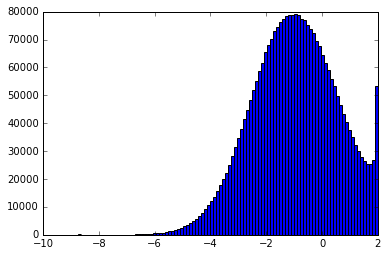

In [22]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
plt.hist(np.log10(firm_prod['pct']).replace(-np.inf, np.nan).dropna().values, 100)
plt.show()